# Семинар 4: Object Detection 




In [100]:
import os
import json
import random
from pathlib import Path
from PIL import Image
import numpy as np
import xml.etree.ElementTree as ET
from collections import defaultdict

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.transforms.functional as TF

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Rectangle

from tqdm import tqdm

torch.manual_seed(42)
np.random.seed(42)
random.seed(42)


## Форматы аннотаций для Object Detection



### Структура датасета



In [101]:
DATA_ROOT = "data/craters"
TRAIN_IMAGES = os.path.join(DATA_ROOT, "train/images")
TRAIN_LABELS = os.path.join(DATA_ROOT, "train/labels")
VALID_IMAGES = os.path.join(DATA_ROOT, "valid/images")
VALID_LABELS = os.path.join(DATA_ROOT, "valid/labels")

print(f"Train images: {len(os.listdir(TRAIN_IMAGES))}")
print(f"Train labels: {len(os.listdir(TRAIN_LABELS))}")
print(f"Valid images: {len(os.listdir(VALID_IMAGES))}")
print(f"Valid labels: {len(os.listdir(VALID_LABELS))}")

sample_image = os.listdir(TRAIN_IMAGES)[0]
sample_label = sample_image.replace('.jpg', '.txt')
print(f"\nПример изображения: {sample_image}")
print(f"Пример аннотации: {sample_label}")

img_path = os.path.join(TRAIN_IMAGES, sample_image)
img = Image.open(img_path)
print(f"\nРазмер изображения: {img.size}")

label_path = os.path.join(TRAIN_LABELS, sample_label)
with open(label_path, 'r') as f:
    lines = f.readlines()
    print(f"\nКоличество объектов: {len(lines)}")
    print("Первые 3 аннотации:")
    for i, line in enumerate(lines[:3]):
        print(f"  {i+1}: {line.strip()}")


Train images: 98
Train labels: 98
Valid images: 26
Valid labels: 26

Пример изображения: 011_png.rf.8ac312b4898f0106d10b76952a55d237.jpg
Пример аннотации: 011_png.rf.8ac312b4898f0106d10b76952a55d237.txt

Размер изображения: (640, 640)

Количество объектов: 10
Первые 3 аннотации:
  1: 0 0.44921875 0.0765625 0.0859375 0.09609375
  2: 0 0.3234375 0.86640625 0.184375 0.17734375
  3: 0 0.1125 0.87734375 0.215625 0.2203125


### Формат 1: YOLO (You Only Look Once)

**YOLO формат** - самый популярный формат для детекции объектов, особенно в современных фреймворках.

**Структура:**
- Каждое изображение имеет соответствующий `.txt` файл с таким же именем
- Каждая строка в файле: `class_id center_x center_y width height`
- Все координаты **нормализованы** от 0 до 1 (относительно размера изображения)
- `center_x, center_y` - центр бокса
- `width, height` - ширина и высота бокса

**Преимущества:**
- Простота и компактность
- Быстрая загрузка
- Широко используется в YOLO, Ultralytics и других фреймворках


In [102]:
def parse_yolo_annotation(label_path, img_width, img_height):
    """
    Парсит YOLO аннотацию и возвращает боксы в абсолютных координатах

    """
    boxes = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                center_x = float(parts[1]) * img_width
                center_y = float(parts[2]) * img_height
                width = float(parts[3]) * img_width
                height = float(parts[4]) * img_height
                
                x_min = center_x - width / 2
                y_min = center_y - height / 2
                x_max = center_x + width / 2
                y_max = center_y + height / 2
                
                boxes.append({
                    'class': class_id,
                    'x_center': center_x,
                    'y_center': center_y,
                    'width': width,
                    'height': height,
                    'x_min': x_min,
                    'y_min': y_min,
                    'x_max': x_max,
                    'y_max': y_max
                })
    return boxes

sample_boxes = parse_yolo_annotation(label_path, img.size[0], img.size[1])
print(f"Найдено {len(sample_boxes)} объектов")
print(sample_boxes[0])


Найдено 10 объектов
{'class': 0, 'x_center': 287.5, 'y_center': 49.0, 'width': 55.0, 'height': 61.5, 'x_min': 260.0, 'y_min': 18.25, 'x_max': 315.0, 'y_max': 79.75}


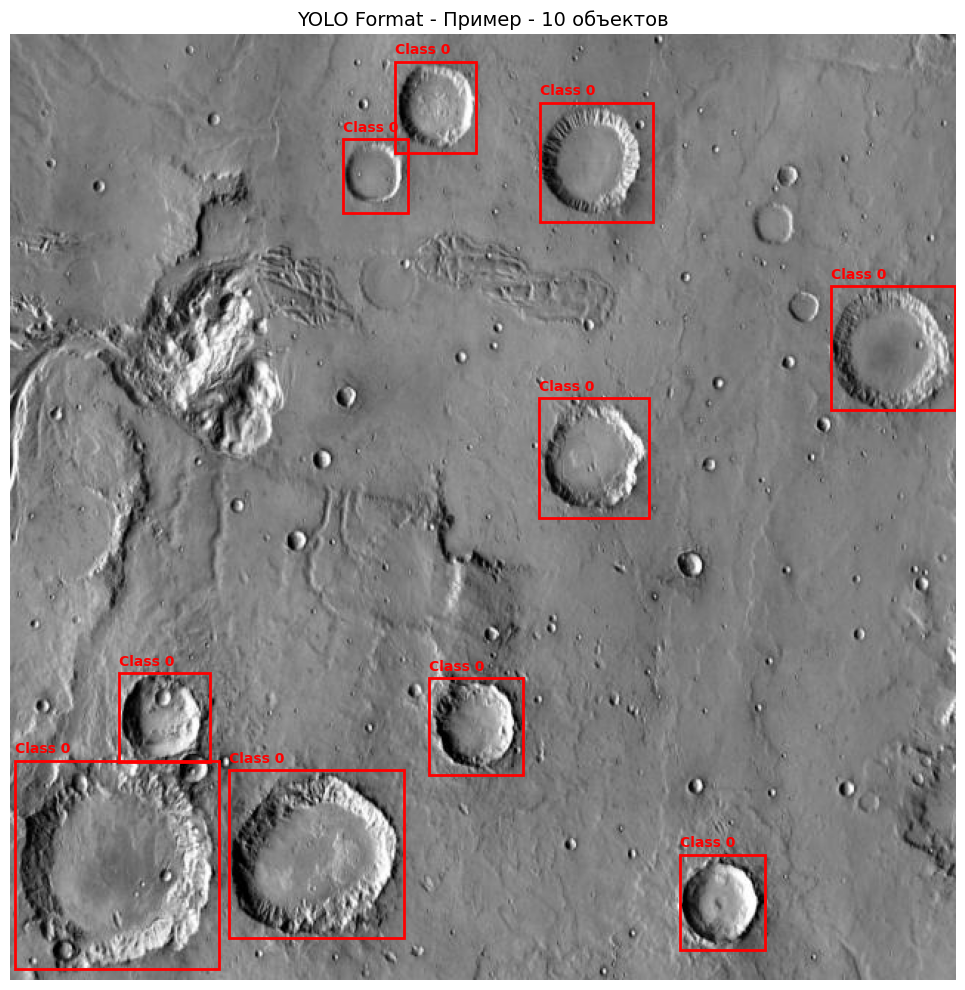

In [103]:
def visualize_boxes(image_path, label_path, title="YOLO Format"):
    """Визуализирует изображение с боксами из YOLO аннотации"""
    img = Image.open(image_path)
    boxes = parse_yolo_annotation(label_path, img.size[0], img.size[1])
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(img)
    ax.set_title(f"{title} - {len(boxes)} объектов", fontsize=14)
    ax.axis('off')
    
    for box in boxes:
        rect = Rectangle(
            (box['x_min'], box['y_min']),
            box['width'],
            box['height'],
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(box['x_min'], box['y_min'] - 5, f"Class {box['class']}", 
                color='red', fontsize=10, weight='bold')
    
    plt.tight_layout()
    plt.show()

# Визуализируем пример
visualize_boxes(img_path, label_path, "YOLO Format - Пример")


### Формат 2: COCO (Common Objects in Context)

**COCO формат** - JSON формат, используемый в датасете COCO и многих других.

**Структура:**
```json
{
  "images": [{"id": 1, "file_name": "image.jpg", "width": 640, "height": 640}],
  "annotations": [{
    "id": 1,
    "image_id": 1,
    "category_id": 0,
    "bbox": [x_min, y_min, width, height],  // абсолютные координаты
    "area": float,
    "iscrowd": 0
  }],
  "categories": [{"id": 0, "name": "crater"}]
}
```

**Преимущества:**
- Структурированный JSON формат
- Поддержка дополнительных метаданных
- Стандарт для многих конкурсов

**Недостатки:**
- Более громоздкий формат
- Медленнее загружается


In [104]:
def yolo_to_coco_format(data_root, split='train'):
    """
    Конвертирует YOLO формат в COCO формат

    """
    images_dir = os.path.join(data_root, split, "images")
    labels_dir = os.path.join(data_root, split, "labels")
    
    coco_data = {
        "images": [],
        "annotations": [],
        "categories": [{"id": 0, "name": "crater", "supercategory": "none"}]
    }
    
    image_id = 0
    annotation_id = 0
    
    for img_file in sorted(os.listdir(images_dir)):
        if not img_file.endswith(('.jpg', '.png')):
            continue
            
        img_path = os.path.join(images_dir, img_file)
        img = Image.open(img_path)
        width, height = img.size
        
        coco_data["images"].append({
            "id": image_id,
            "file_name": img_file,
            "width": width,
            "height": height
        })
        
        label_file = img_file.replace('.jpg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(labels_dir, label_file)
        
        if os.path.exists(label_path):
            boxes = parse_yolo_annotation(label_path, width, height)
            
            for box in boxes:
                # COCO формат: [x_min, y_min, width, height]
                coco_data["annotations"].append({
                    "id": annotation_id,
                    "image_id": image_id,
                    "category_id": box['class'],
                    "bbox": [box['x_min'], box['y_min'], box['width'], box['height']],
                    "area": box['width'] * box['height'],
                    "iscrowd": 0
                })
                annotation_id += 1
        
        image_id += 1
    
    return coco_data

coco_train = yolo_to_coco_format(DATA_ROOT, split='train')
print(json.dumps(coco_train, indent=2)[:500] + "...")
print(f"\nВсего изображений: {len(coco_train['images'])}")
print(f"Всего аннотаций: {len(coco_train['annotations'])}")
print(f"Категории: {coco_train['categories']}")


{
  "images": [
    {
      "id": 0,
      "file_name": "011_png.rf.8ac312b4898f0106d10b76952a55d237.jpg",
      "width": 640,
      "height": 640
    },
    {
      "id": 1,
      "file_name": "012_png.rf.64da6ff4c62638096ee6e5bf689706bc.jpg",
      "width": 640,
      "height": 640
    },
    {
      "id": 2,
      "file_name": "013_png.rf.ee44d5aa33fd33a1ed62ae233180f505.jpg",
      "width": 640,
      "height": 640
    },
    {
      "id": 3,
      "file_name": "016_png.rf.1973f9540ae7f67225...

Всего изображений: 98
Всего аннотаций: 681
Категории: [{'id': 0, 'name': 'crater', 'supercategory': 'none'}]


### Формат 3: PASCAL VOC

**PASCAL VOC** — классический XML-формат, который долгое время был стандартом в академических работах и соревнованиях PASCAL VOC.

**Структура:**
- Для каждого изображения создаётся XML-файл с тегом `<annotation>`.
- Хранится информация об изображении (`filename`, `size`).
- Каждый объект описывается отдельным `<object>` с вложенным `<bndbox>` (координаты в абсолютных пикселях: `xmin`, `ymin`, `xmax`, `ymax`).

**Плюсы:**
- Читаемый человеком XML, легко просматривать и редактировать вручную.
- Поддерживает дополнительные поля (pose, truncated, difficult).
- Хорошо интегрирован во многие старые инструменты аннотации.

**Минусы:**
- Объёмные файлы и медленная загрузка по сравнению с YOLO/COCO.
- Нет нормализации координат — привязан к исходному разрешению изображения.
- Тяжело масштабируется на десятки тысяч объектов.



In [105]:
def yolo_to_pascal_voc(image_path, label_path, output_path):
    """
    Конвертирует YOLO формат в PASCAL VOC XML формат

    """
    img = Image.open(image_path)
    width, height = img.size
    filename = os.path.basename(image_path)
    
    boxes = parse_yolo_annotation(label_path, width, height)
    
    # Создаем XML структуру
    root = ET.Element("annotation")
    
    ET.SubElement(root, "filename").text = filename
    
    size = ET.SubElement(root, "size")
    ET.SubElement(size, "width").text = str(width)
    ET.SubElement(size, "height").text = str(height)
    ET.SubElement(size, "depth").text = "3"
    
    for box in boxes:
        obj = ET.SubElement(root, "object")
        ET.SubElement(obj, "name").text = "crater"
        ET.SubElement(obj, "pose").text = "Unspecified"
        ET.SubElement(obj, "truncated").text = "0"
        ET.SubElement(obj, "difficult").text = "0"
        
        bndbox = ET.SubElement(obj, "bndbox")
        ET.SubElement(bndbox, "xmin").text = str(int(box['x_min']))
        ET.SubElement(bndbox, "ymin").text = str(int(box['y_min']))
        ET.SubElement(bndbox, "xmax").text = str(int(box['x_max']))
        ET.SubElement(bndbox, "ymax").text = str(int(box['y_max']))
    
    tree = ET.ElementTree(root)
    ET.indent(tree, space="  ")
    tree.write(output_path, encoding='utf-8', xml_declaration=True)
    
    return root

sample_voc_path = "annotation.xml"
voc_xml = yolo_to_pascal_voc(img_path, label_path, sample_voc_path)

print(ET.tostring(voc_xml, encoding='unicode', method='xml')[:800])


<annotation>
  <filename>011_png.rf.8ac312b4898f0106d10b76952a55d237.jpg</filename>
  <size>
    <width>640</width>
    <height>640</height>
    <depth>3</depth>
  </size>
  <object>
    <name>crater</name>
    <pose>Unspecified</pose>
    <truncated>0</truncated>
    <difficult>0</difficult>
    <bndbox>
      <xmin>260</xmin>
      <ymin>18</ymin>
      <xmax>315</xmax>
      <ymax>79</ymax>
    </bndbox>
  </object>
  <object>
    <name>crater</name>
    <pose>Unspecified</pose>
    <truncated>0</truncated>
    <difficult>0</difficult>
    <bndbox>
      <xmin>148</xmin>
      <ymin>497</ymin>
      <xmax>266</xmax>
      <ymax>611</ymax>
    </bndbox>
  </object>
  <object>
    <name>crater</name>
    <pose>Unspecified</pose>
    <truncated>0</truncated>
    <difficult>0</difficult>
  


### Сравнение форматов

| Формат | Размер файла | Скорость загрузки | Популярность | Использование |
|--------|--------------|-------------------|--------------|---------------|
| **YOLO** | Маленький | Быстрая | ***** | YOLO, Ultralytics, большинство современных фреймворков |
| **COCO** | Средний | Средняя | **** | COCO датасет, конкурсы, исследовательские работы |
| **PASCAL VOC** | Большой | Медленная | ** | Старые датасеты, некоторые инструменты |



## Anchor Boxes и YOLO-подобная архитектура

### Что такое Anchor Boxes?

**Anchor Boxes (якорные боксы)** - это предопределенные шаблоны размеров объектов, которые помогают модели лучше предсказывать объекты разных размеров и пропорций.

#### Проблема без Anchor Boxes:
- Если в одной ячейке сетки может быть несколько объектов разного размера, модель может их пропустить
- Модель должна "угадывать" размеры объектов с нуля, что сложнее

#### Решение с Anchor Boxes:
- Каждая ячейка сетки предсказывает **несколько боксов** (например, 3)
- Каждый бокс "привязан" к определенному anchor box (шаблону размера)
- Модель предсказывает **отклонения** от anchor box, а не абсолютные размеры
- Это упрощает обучение и улучшает точность

#### Пример:
Представим, что у нас есть 3 anchor boxes:
- **Anchor 1:** маленький (ширина=0.1, высота=0.1) - для маленьких кратеров
- **Anchor 2:** средний (ширина=0.2, высота=0.2) - для средних кратеров  
- **Anchor 3:** большой (ширина=0.4, высота=0.4) - для больших кратеров

Модель для каждой ячейки предсказывает:
- Для Anchor 1: (x, y, Δw, Δh, confidence)
- Для Anchor 2: (x, y, Δw, Δh, confidence)
- Для Anchor 3: (x, y, Δw, Δh, confidence)

Где Δw и Δh - это отклонения от размеров anchor box.

### Архитектура с Anchor Boxes:
- **Вход:** 416x416x3
- **Энкодер:** Сверточные слои с даунсемплингом до 13x13
- **Выход:** 13x13x15 (3 бокса × 5 параметров: x, y, w, h, confidence)
- **Grid cells:** 13x13 = 169 ячеек, каждая предсказывает **3 бокса**


In [106]:
class SimpleYOLO(nn.Module):
    """
    Простая YOLO-подобная архитектура для детекции объектов с Anchor Boxes

    """
    
    def __init__(self, num_classes=1, num_anchors=3):
        super(SimpleYOLO, self).__init__()
        self.num_classes = num_classes
        self.num_anchors = num_anchors
        
        # Энкодер (backbone)
        self.backbone = nn.Sequential(
            # Block 1: 416x416 -> 208x208
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1, inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 208x208
            
            # Block 2: 208x208 -> 104x104
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(128, 64, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 104x104
            
            # Block 3: 104x104 -> 52x52
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(256, 128, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1, inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 52x52
            
            # Block 4: 52x52 -> 26x26
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(512, 256, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1, inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 26x26
            
            # Block 5: 26x26 -> 13x13
            nn.Conv2d(512, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(1024, 512, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(512, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.1, inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # 13x13
        )
        
        # Голова детекции
        # Выход: 13x13x(5*num_anchors) = 13x13x15 для 3 anchor boxes
        # Каждый anchor box предсказывает: x, y, w, h, confidence
        self.detection_head = nn.Sequential(
            nn.Conv2d(1024, 256, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(256, 5 * num_anchors, kernel_size=1, stride=1, padding=0),  # 15 = 3 * 5
        )
        
    def forward(self, x):

        features = self.backbone(x)
        output = self.detection_head(features)
        return output

def compute_anchor_boxes(data_root, split='train', num_anchors=3, img_size=416):
    """
    Вычисляет оптимальные anchor boxes на основе статистики датасета
    Использует K-means кластеризацию размеров боксов
    """
    images_dir = os.path.join(data_root, split, "images")
    labels_dir = os.path.join(data_root, split, "labels")
    
    # Собираем все размеры боксов из датасета
    box_sizes = []
    for img_file in os.listdir(images_dir):
        if not img_file.endswith(('.jpg', '.png')):
            continue
        label_file = img_file.replace('.jpg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(labels_dir, label_file)
        
        if os.path.exists(label_path):
            img_path = os.path.join(images_dir, img_file)
            img = Image.open(img_path)
            width, height = img.size
            
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        w = float(parts[3])
                        h = float(parts[4])
                        box_sizes.append([w, h])
    
    if len(box_sizes) == 0:
        # Если нет данных, используем дефолтные anchor boxes
        return [(0.1, 0.1), (0.2, 0.2), (0.4, 0.4)]
    
    box_sizes = np.array(box_sizes)
    
    # Простой K-means для кластеризации размеров
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=num_anchors, random_state=42, n_init=10)
    kmeans.fit(box_sizes)
    
    anchors = []
    for center in kmeans.cluster_centers_:
        anchors.append((float(center[0]), float(center[1])))
    
    # Сортируем по размеру (площади)
    anchors.sort(key=lambda x: x[0] * x[1])
    
    return anchors

anchors = compute_anchor_boxes(DATA_ROOT, split='train', num_anchors=3, img_size=416)
for i, (w, h) in enumerate(anchors):
    print(f"  Anchor {i+1}: width={w:.4f}, height={h:.4f}, площадь={w*h:.4f}")

model = SimpleYOLO(num_classes=1, num_anchors=3)

dummy_input = torch.randn(1, 3, 416, 416)
with torch.no_grad():
    output = model(dummy_input)

print(f"\nВходной размер: {dummy_input.shape}")
print(f"Выходной размер: {output.shape}")

print(f"\nКоличество параметров: {sum(p.numel() for p in model.parameters()):,}")


  Anchor 1: width=0.0515, height=0.0646, площадь=0.0033
  Anchor 2: width=0.1799, height=0.2222, площадь=0.0400
  Anchor 3: width=0.6142, height=0.8012, площадь=0.4921

Входной размер: torch.Size([1, 3, 416, 416])
Выходной размер: torch.Size([1, 15, 13, 13])

Количество параметров: 13,530,831


### Визуализация Anchor Boxes



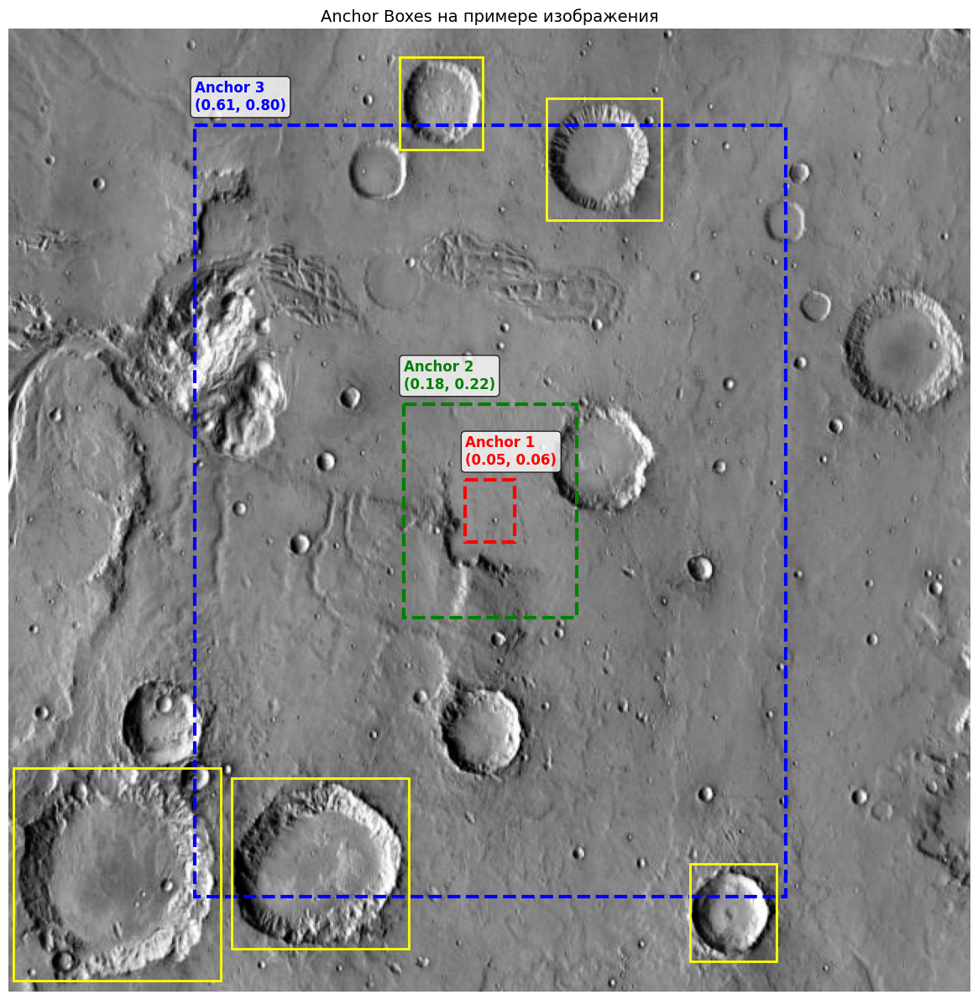

In [107]:
sample_img = Image.open(img_path)
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ax.imshow(sample_img)
ax.set_title("Anchor Boxes на примере изображения", fontsize=14)
ax.axis('off')

img_width, img_height = sample_img.size
center_x, center_y = img_width / 2, img_height / 2

colors = ['red', 'green', 'blue']
for i, (anchor_w, anchor_h) in enumerate(anchors):
    abs_w = anchor_w * img_width
    abs_h = anchor_h * img_height
    
    x_min = center_x - abs_w / 2
    y_min = center_y - abs_h / 2
    
    rect = Rectangle(
        (x_min, y_min),
        abs_w,
        abs_h,
        linewidth=3,
        edgecolor=colors[i],
        facecolor='none',
        linestyle='--'
    )
    ax.add_patch(rect)
    ax.text(x_min, y_min - 10, f"Anchor {i+1}\n({anchor_w:.2f}, {anchor_h:.2f})", 
            color=colors[i], fontsize=12, weight='bold', 
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

gt_boxes = parse_yolo_annotation(label_path, img_width, img_height)
for box in gt_boxes[:5]:
    rect = Rectangle(
        (box['x_min'], box['y_min']),
        box['width'],
        box['height'],
        linewidth=2,
        edgecolor='yellow',
        facecolor='none'
    )
    ax.add_patch(rect)

plt.tight_layout()
plt.show()


In [108]:
def decode_yolo_output(output, anchors, img_size=416, grid_size=13, conf_threshold=0.5):
    """
    Декодирует выход YOLO модели с anchor boxes в боксы

    """
    batch_size = output.shape[0]
    num_anchors = len(anchors)
    boxes = []
    
    # Реорганизуем выход: (B, 15, 13, 13) -> (B, num_anchors, 5, 13, 13)
    output = output.view(batch_size, num_anchors, 5, grid_size, grid_size)
    
    # Применяем сигмоиду к confidence
    output = output.clone()
    output[:, :, 4, :, :] = torch.sigmoid(output[:, :, 4, :, :])
    
    for b in range(batch_size):
        for i in range(grid_size):
            for j in range(grid_size):
                for anchor_idx in range(num_anchors):
                    # Извлекаем предсказания для ячейки (i, j) и anchor box anchor_idx
                    x = output[b, anchor_idx, 0, i, j].item()
                    y = output[b, anchor_idx, 1, i, j].item()
                    w_pred = output[b, anchor_idx, 2, i, j].item()
                    h_pred = output[b, anchor_idx, 3, i, j].item()
                    conf = output[b, anchor_idx, 4, i, j].item()
                    
                    if conf > conf_threshold:
                        # x, y - относительные координаты в ячейке (0-1), применяем сигмоиду
                        x = torch.sigmoid(torch.tensor(x)).item()
                        y = torch.sigmoid(torch.tensor(y)).item()
                        
                        # w, h - предсказываем как отклонения от anchor box
                        # Используем экспоненту для положительных значений
                        anchor_w, anchor_h = anchors[anchor_idx]
                        w = anchor_w * np.exp(w_pred)
                        h = anchor_h * np.exp(h_pred)
                        
                        # Конвертируем в абсолютные координаты
                        cell_size = img_size / grid_size
                        abs_x = (j + x) * cell_size
                        abs_y = (i + y) * cell_size
                        abs_w = w * img_size
                        abs_h = h * img_size
                        
                        # Конвертируем в формат (x_min, y_min, x_max, y_max)
                        x_min = abs_x - abs_w / 2
                        y_min = abs_y - abs_h / 2
                        x_max = abs_x + abs_w / 2
                        y_max = abs_y + abs_h / 2
                        
                        boxes.append((x_min, y_min, x_max, y_max, conf))
    
    return boxes

test_img_path = os.path.join(TRAIN_IMAGES, sample_image)
test_img = Image.open(test_img_path).convert('RGB')
original_size = test_img.size

transform = transforms.Compose([
    transforms.Resize((416, 416)),
    transforms.ToTensor(),
])
img_tensor = transform(test_img).unsqueeze(0)

model.eval()
with torch.no_grad():
    output = model(img_tensor)

predicted_boxes = decode_yolo_output(output, anchors, img_size=416, conf_threshold=0.3)

print(f"Изображение: {original_size}")
print(f"Вход модели: 416x416")
print(f"Выход модели: {output.shape}")
print(f"\nПредсказано боксов (conf > 0.3): {len(predicted_boxes)}")


Изображение: (640, 640)
Вход модели: 416x416
Выход модели: torch.Size([1, 15, 13, 13])

Предсказано боксов (conf > 0.3): 507


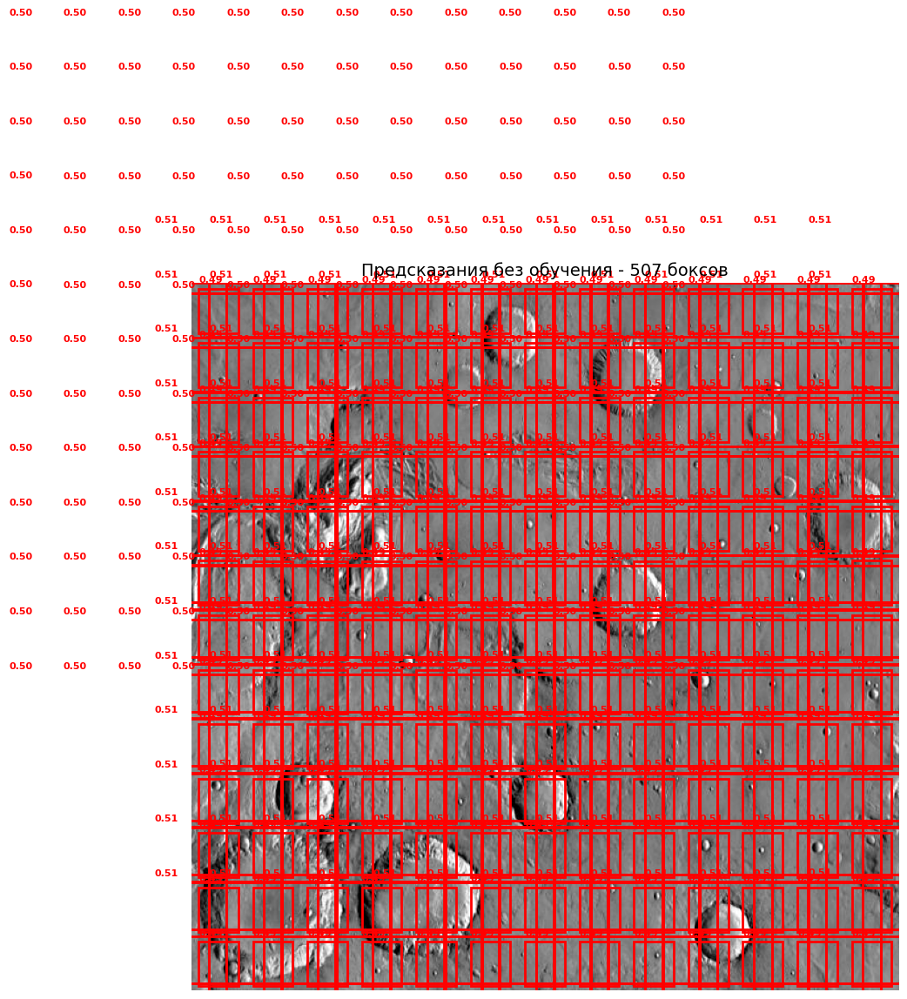

In [109]:
def visualize_predictions(image, boxes, title="Predictions", scale_factor=1.0):
    """Визуализирует изображение с предсказанными боксами"""
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    ax.imshow(image)
    ax.set_title(f"{title} - {len(boxes)} боксов", fontsize=14)
    ax.axis('off')
    
    for i, (x_min, y_min, x_max, y_max, conf) in enumerate(boxes):
        # Масштабируем координаты обратно к оригинальному размеру
        x_min_scaled = x_min * scale_factor
        y_min_scaled = y_min * scale_factor
        width_scaled = (x_max - x_min) * scale_factor
        height_scaled = (y_max - y_min) * scale_factor
        
        rect = Rectangle(
            (x_min_scaled, y_min_scaled),
            width_scaled,
            height_scaled,
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(x_min_scaled, y_min_scaled - 5, f"{conf:.2f}", 
                color='red', fontsize=8, weight='bold')
    
    plt.tight_layout()
    plt.show()

scale_x = original_size[0] / 416
scale_y = original_size[1] / 416

visualize_predictions(test_img, predicted_boxes,  
                     title="Предсказания без обучения", 
                     scale_factor=scale_x)


Как видно, без обучения модель генерирует множество случайных боксов.

Теперь реализуем **Non-Maximum Suppression (NMS)** - алгоритм для удаления дублирующихся детекций.


## Non-Maximum Suppression (NMS)

**NMS** - алгоритм для удаления дублирующихся детекций. Он оставляет только бокс с наибольшей уверенностью среди перекрывающихся боксов.

### Алгоритм:
1. Сортируем боксы по уверенности (confidence)
2. Берем бокс с наибольшей уверенностью
3. Удаляем все боксы, которые сильно перекрываются с ним (IoU > threshold)
4. Повторяем для оставшихся боксов


In [110]:
def calculate_iou(box1, box2):
    """
    Вычисляет Intersection over Union (IoU) между двумя боксами

    """
    x1_min, y1_min, x1_max, y1_max = box1[:4]
    x2_min, y2_min, x2_max, y2_max = box2[:4]
    
    # Вычисляем площадь пересечения
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)
    
    if inter_x_max <= inter_x_min or inter_y_max <= inter_y_min:
        return 0.0
    
    inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)
    
    # Вычисляем площадь объединения
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = box1_area + box2_area - inter_area
    
    if union_area == 0:
        return 0.0
    
    iou = inter_area / union_area
    return iou

box1 = (10, 10, 50, 50)
box2 = (30, 30, 70, 70)  # Перекрывается с box1
box3 = (100, 100, 150, 150)  # Не перекрывается

print(f"IoU(box1, box2) = {calculate_iou(box1, box2):.3f}")
print(f"IoU(box1, box3) = {calculate_iou(box1, box3):.3f}")


IoU(box1, box2) = 0.143
IoU(box1, box3) = 0.000


In [111]:
def non_max_suppression(boxes, iou_threshold=0.5, conf_threshold=0.5):
    """
    Применяет Non-Maximum Suppression к списку боксо
    """
    # Фильтруем по уверенности
    filtered = [box for box in boxes if box[4] >= conf_threshold]
    
    if len(filtered) == 0:
        return []
    
    # Сортируем по уверенности (убывание)
    filtered.sort(key=lambda x: x[4], reverse=True)
    
    # Применяем NMS
    keep = []
    while len(filtered) > 0:
        # Берем бокс с наибольшей уверенностью
        current = filtered.pop(0)
        keep.append(current)
        
        # Удаляем все боксы, которые сильно перекрываются с текущим
        filtered = [
            box for box in filtered
            if calculate_iou(current[:4], box[:4]) < iou_threshold
        ]
    
    return keep


nms_boxes = non_max_suppression(predicted_boxes, iou_threshold=0.4, conf_threshold=0.4)

print(f"До NMS: {len(predicted_boxes)} боксов (conf > 0.3)")
print(f"После NMS: {len(nms_boxes)} боксов (conf > 0.4, IoU < 0.4)")
print(f"Удалено: {len(predicted_boxes) - len(nms_boxes)} дублирующихся детекций")


До NMS: 507 боксов (conf > 0.3)
После NMS: 251 боксов (conf > 0.4, IoU < 0.4)
Удалено: 256 дублирующихся детекций


**Важно:** После NMS остается много боксов (около 270) - это нормально для **необученной модели**. 


## Обучение модели



In [112]:
class CraterDataset(Dataset):
    """Датасет для детекции кратеров в формате YOLO с Anchor Boxes"""
    
    def __init__(self, images_dir, labels_dir, anchors, img_size=416, augmentation=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.img_size = img_size
        self.augmentation = augmentation
        self.grid_size = 13
        self.anchors = anchors
        self.num_anchors = len(anchors)
        
        self.image_files = [f for f in os.listdir(images_dir) 
                           if f.endswith(('.jpg', '.png'))]
        
    def __len__(self):
        return len(self.image_files)
    
    def _calculate_iou(self, box1, box2):
        w1, h1 = box1
        w2, h2 = box2
        intersection = min(w1, w2) * min(h1, h2)
        union = w1 * h1 + w2 * h2 - intersection
        return intersection / union if union > 0 else 0.0
    
    def __getitem__(self, idx):
        img_file = self.image_files[idx]
        img_path = os.path.join(self.images_dir, img_file)
        label_file = img_file.replace('.jpg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(self.labels_dir, label_file)
        
        img = Image.open(img_path).convert('RGB')
        original_size = img.size
        
        boxes = []
        if os.path.exists(label_path):
            boxes = parse_yolo_annotation(label_path, original_size[0], original_size[1])
        
        if self.augmentation:
            img = np.array(img)
            img = Image.fromarray(img)
        
        transform = transforms.Compose([
            transforms.Resize((self.img_size, self.img_size)),
            transforms.ToTensor(),
        ])
        img_tensor = transform(img)

        target = torch.zeros(self.num_anchors, 5, self.grid_size, self.grid_size)
        
        scale_x = self.img_size / original_size[0]
        scale_y = self.img_size / original_size[1]
        
        for box in boxes:
            x_center = box['x_center'] * scale_x
            y_center = box['y_center'] * scale_y
            width = box['width'] * scale_x
            height = box['height'] * scale_y
            
            grid_x = int(x_center / (self.img_size / self.grid_size))
            grid_y = int(y_center / (self.img_size / self.grid_size))
            
            # Ограничиваем индексы
            grid_x = max(0, min(self.grid_size - 1, grid_x))
            grid_y = max(0, min(self.grid_size - 1, grid_y))
            
            # Нормализуем размеры для сравнения с anchor boxes
            w_norm = width / self.img_size
            h_norm = height / self.img_size
            
            # Находим лучший anchor box (по IoU)
            best_iou = 0
            best_anchor_idx = 0
            for anchor_idx, (anchor_w, anchor_h) in enumerate(self.anchors):
                iou = self._calculate_iou((w_norm, h_norm), (anchor_w, anchor_h))
                if iou > best_iou:
                    best_iou = iou
                    best_anchor_idx = anchor_idx
            
            # Нормализуем координаты относительно ячейки
            cell_size = self.img_size / self.grid_size
            x_norm = (x_center - grid_x * cell_size) / cell_size
            y_norm = (y_center - grid_y * cell_size) / cell_size
            
            # Вычисляем отклонения от anchor box для w, h
            anchor_w, anchor_h = self.anchors[best_anchor_idx]
            w_pred = np.log(w_norm / anchor_w) if w_norm > 0 else 0
            h_pred = np.log(h_norm / anchor_h) if h_norm > 0 else 0
            
            # Записываем в target для лучшего anchor box
            if target[best_anchor_idx, 4, grid_y, grid_x] == 0:  # Если еще не занято
                target[best_anchor_idx, 0, grid_y, grid_x] = x_norm
                target[best_anchor_idx, 1, grid_y, grid_x] = y_norm
                target[best_anchor_idx, 2, grid_y, grid_x] = w_pred
                target[best_anchor_idx, 3, grid_y, grid_x] = h_pred
                target[best_anchor_idx, 4, grid_y, grid_x] = 1.0  # confidence = 1
        
        return img_tensor, target

train_dataset = CraterDataset(TRAIN_IMAGES, TRAIN_LABELS, anchors, img_size=416)
valid_dataset = CraterDataset(VALID_IMAGES, VALID_LABELS, anchors, img_size=416)

print(f"Train samples: {len(train_dataset)}")
print(f"Valid samples: {len(valid_dataset)}")

# Проверяем загрузку
sample_img, sample_target = train_dataset[0]
print(f"\nSample image shape: {sample_img.shape}")
print(f"Sample target shape: {sample_target.shape}")
print(f"  - {sample_target.shape[0]} anchor boxes")

print(f"Objects in sample: {sample_target[:, 4, :, :].sum().item()} (по всем anchor boxes)")


Train samples: 98
Valid samples: 26

Sample image shape: torch.Size([3, 416, 416])
Sample target shape: torch.Size([3, 5, 13, 13])
  - 3 anchor boxes
Objects in sample: 10.0 (по всем anchor boxes)


In [113]:
def yolo_loss(pred, target, lambda_coord=5.0, lambda_noobj=0.5):
    """
    Функция потерь для YOLO с Anchor Boxes

    """
    batch_size = pred.shape[0]
    num_anchors = target.shape[1]
    
    # Реорганизуем pred: (B, 15, 13, 13) -> (B, 3, 5, 13, 13)
    pred = pred.view(batch_size, num_anchors, 5, 13, 13)
    
    total_coord_loss = 0
    total_obj_conf_loss = 0
    total_noobj_conf_loss = 0
    
    # Применяем сигмоиду к confidence
    pred_conf = torch.sigmoid(pred[:, :, 4, :, :])  # (B, 3, 13, 13)
    
    for anchor_idx in range(num_anchors):
        # Маска для ячеек с объектами для этого anchor box
        obj_mask = target[:, anchor_idx, 4, :, :] > 0  # (B, 13, 13)
        noobj_mask = target[:, anchor_idx, 4, :, :] == 0
        
        # Потеря по координатам (только для ячеек с объектами)
        if obj_mask.sum() > 0:
            coord_loss = lambda_coord * (
                F.mse_loss(pred[:, anchor_idx, 0, :, :][obj_mask], 
                          target[:, anchor_idx, 0, :, :][obj_mask]) +
                F.mse_loss(pred[:, anchor_idx, 1, :, :][obj_mask], 
                          target[:, anchor_idx, 1, :, :][obj_mask]) +
                F.mse_loss(pred[:, anchor_idx, 2, :, :][obj_mask], 
                          target[:, anchor_idx, 2, :, :][obj_mask]) +
                F.mse_loss(pred[:, anchor_idx, 3, :, :][obj_mask], 
                          target[:, anchor_idx, 3, :, :][obj_mask])
            )
            total_coord_loss += coord_loss
        
        # Потеря по confidence для ячеек с объектами
        if obj_mask.sum() > 0:
            obj_conf_loss = F.mse_loss(
                pred_conf[:, anchor_idx, :, :][obj_mask],
                target[:, anchor_idx, 4, :, :][obj_mask]
            )
            total_obj_conf_loss += obj_conf_loss
        
        # Потеря по confidence для фоновых ячеек
        if noobj_mask.sum() > 0:
            noobj_conf_loss = lambda_noobj * F.mse_loss(
                pred_conf[:, anchor_idx, :, :][noobj_mask],
                target[:, anchor_idx, 4, :, :][noobj_mask]
            )
            total_noobj_conf_loss += noobj_conf_loss
    
    total_loss = total_coord_loss + total_obj_conf_loss + total_noobj_conf_loss
    return total_loss, total_coord_loss, total_obj_conf_loss, total_noobj_conf_loss

dummy_pred = torch.randn(2, 15, 13, 13)  # 3 anchor boxes * 5 параметров
dummy_target = torch.zeros(2, 3, 5, 13, 13)  # 3 anchor boxes
dummy_target[0, 0, 4, 5, 5] = 1.0  # Один объект в первом батче, первый anchor box
dummy_target[0, 0, 0:4, 5, 5] = torch.rand(4)  # Случайные координаты

loss, coord, obj_conf, noobj_conf = yolo_loss(dummy_pred, dummy_target)
print(f"Total loss: {loss.item():.4f}")
print(f"Coord loss: {coord.item():.4f}")
print(f"Obj conf loss: {obj_conf.item():.4f}")
print(f"Noobj conf loss: {noobj_conf.item():.4f}")


Total loss: 21.4620
Coord loss: 20.3991
Obj conf loss: 0.6270
Noobj conf loss: 0.4359


In [114]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=0)
valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, num_workers=0)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"device: {device}")

model = SimpleYOLO(num_classes=1, num_anchors=3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

num_epochs = 10



device: cpu


In [82]:
train_losses = []
valid_losses = []

for epoch in range(num_epochs):
    model.train()
    epoch_train_loss = 0
    for batch_idx, (images, targets) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
        images = images.to(device)
        targets = targets.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss, coord_loss, obj_conf_loss, noobj_conf_loss = yolo_loss(outputs, targets)
        loss.backward()
        optimizer.step()
        
        epoch_train_loss += loss.item()
    
    avg_train_loss = epoch_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    
    model.eval()
    epoch_valid_loss = 0
    with torch.no_grad():
        for images, targets in valid_loader:
            images = images.to(device)
            targets = targets.to(device)
            outputs = model(images)
            loss, _, _, _ = yolo_loss(outputs, targets)
            epoch_valid_loss += loss.item()
    
    avg_valid_loss = epoch_valid_loss / len(valid_loader)
    valid_losses.append(avg_valid_loss)
    
    scheduler.step()
    
    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"  Train Loss: {avg_train_loss:.4f}")
    print(f"  Valid Loss: {avg_valid_loss:.4f}")
    print(f"  LR: {scheduler.get_last_lr()[0]:.6f}")
    print()



Epoch 1/10: 100%|██████████| 13/13 [02:27<00:00, 11.32s/it]


Epoch 1/10
  Train Loss: 36.8798
  Valid Loss: 17.5819
  LR: 0.001000



Epoch 2/10: 100%|██████████| 13/13 [02:17<00:00, 10.56s/it]


Epoch 2/10
  Train Loss: 13.0652
  Valid Loss: 10.7786
  LR: 0.001000



Epoch 3/10: 100%|██████████| 13/13 [01:55<00:00,  8.92s/it]


Epoch 3/10
  Train Loss: 8.8226
  Valid Loss: 11.2035
  LR: 0.001000



Epoch 4/10: 100%|██████████| 13/13 [01:53<00:00,  8.74s/it]


Epoch 4/10
  Train Loss: 7.7835
  Valid Loss: 8.3304
  LR: 0.001000



Epoch 5/10: 100%|██████████| 13/13 [01:53<00:00,  8.76s/it]


Epoch 5/10
  Train Loss: 6.6643
  Valid Loss: 9.4536
  LR: 0.001000



Epoch 6/10: 100%|██████████| 13/13 [02:00<00:00,  9.24s/it]


Epoch 6/10
  Train Loss: 6.7057
  Valid Loss: 7.5811
  LR: 0.001000



Epoch 7/10: 100%|██████████| 13/13 [01:56<00:00,  8.96s/it]


Epoch 7/10
  Train Loss: 6.7995
  Valid Loss: 7.4112
  LR: 0.001000



Epoch 8/10: 100%|██████████| 13/13 [01:56<00:00,  8.93s/it]


Epoch 8/10
  Train Loss: 6.3718
  Valid Loss: 8.9473
  LR: 0.001000



Epoch 9/10: 100%|██████████| 13/13 [01:57<00:00,  9.02s/it]


Epoch 9/10
  Train Loss: 6.3337
  Valid Loss: 7.1145
  LR: 0.001000



Epoch 10/10: 100%|██████████| 13/13 [01:56<00:00,  8.95s/it]


Epoch 10/10
  Train Loss: 5.9376
  Valid Loss: 7.5831
  LR: 0.000500



## Метрика mAP (mean Average Precision)

Для оценки качества детекции объектов используется метрика **mAP (mean Average Precision)**. Это стандартная метрика для задач детекции объектов.

### Что такое mAP?

**mAP** вычисляется следующим образом:
1. Для каждого класса вычисляется **Average Precision (AP)**
2. **AP** = площадь под кривой Precision-Recall
3. **mAP** = среднее значение AP по всем классам

### Precision и Recall:
- **Precision** = TP / (TP + FP) - доля правильных детекций среди всех предсказаний
- **Recall** = TP / (TP + FN) - доля найденных объектов среди всех реальных объектов

Где:
- **TP (True Positive)** - правильно обнаруженный объект (IoU > threshold)
- **FP (False Positive)** - неправильная детекция (нет реального объекта)
- **FN (False Negative)** - пропущенный объект (не обнаружен)


In [84]:
def calculate_map(pred_boxes_list, gt_boxes_list, iou_threshold=0.5, conf_threshold=0.5):
    """
    Вычисляет mAP (mean Average Precision) для детекции объектов

    """
    all_detections = []
    all_ground_truths = []
    
    # Собираем все детекции и ground truth
    for pred_boxes, gt_boxes in zip(pred_boxes_list, gt_boxes_list):
        # Фильтруем по confidence
        filtered_pred = [(box[0], box[1], box[2], box[3], box[4]) 
                        for box in pred_boxes if box[4] >= conf_threshold]
        
        # Сортируем по confidence (убывание)
        filtered_pred.sort(key=lambda x: x[4], reverse=True)
        
        all_detections.append(filtered_pred)
        all_ground_truths.append([(box[0], box[1], box[2], box[3]) for box in gt_boxes])
    
    # Вычисляем TP и FP для каждого изображения
    tp_list = []
    fp_list = []
    scores_list = []
    
    for pred_boxes, gt_boxes in zip(all_detections, all_ground_truths):
        if len(gt_boxes) == 0:
            # Если нет ground truth, все предсказания - False Positive
            tp_list.extend([0] * len(pred_boxes))
            fp_list.extend([1] * len(pred_boxes))
            scores_list.extend([box[4] for box in pred_boxes])
            continue
        
        # Массив для отслеживания, какие ground truth уже использованы
        gt_used = [False] * len(gt_boxes)
        
        tp = []
        fp = []
        scores = []
        
        for pred_box in pred_boxes:
            pred_coords = pred_box[:4]
            best_iou = 0
            best_gt_idx = -1
            
            # Находим лучший matching ground truth
            for gt_idx, gt_box in enumerate(gt_boxes):
                if gt_used[gt_idx]:
                    continue
                iou = calculate_iou(pred_coords, gt_box)
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = gt_idx
            
            # Определяем TP или FP
            if best_iou >= iou_threshold:
                tp.append(1)
                fp.append(0)
                gt_used[best_gt_idx] = True
            else:
                tp.append(0)
                fp.append(1)
            
            scores.append(pred_box[4])
        
        tp_list.extend(tp)
        fp_list.extend(fp)
        scores_list.extend(scores)
    
    # Сортируем по confidence (убывание)
    sorted_indices = sorted(range(len(scores_list)), key=lambda i: scores_list[i], reverse=True)
    tp_sorted = [tp_list[i] for i in sorted_indices]
    fp_sorted = [fp_list[i] for i in sorted_indices]
    
    # Вычисляем cumulative TP и FP
    tp_cumsum = np.cumsum(tp_sorted)
    fp_cumsum = np.cumsum(fp_sorted)
    
    # Вычисляем общее количество ground truth
    total_gt = sum(len(gt) for gt in all_ground_truths)
    
    # Вычисляем Precision и Recall
    precision = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-8)
    recall = tp_cumsum / (total_gt + 1e-8)
    
    # Вычисляем AP (Average Precision) - площадь под кривой Precision-Recall
    # Используем метод интерполяции (11-point interpolation)
    ap = 0
    for t in np.arange(0, 1.1, 0.1):
        if np.sum(recall >= t) == 0:
            p = 0
        else:
            p = np.max(precision[recall >= t])
        ap += p / 11.0
    
    return ap, precision, recall


test_pred = [(100, 100, 200, 200, 0.9), (150, 150, 250, 250, 0.8), (300, 300, 400, 400, 0.7)]
test_gt = [(110, 110, 210, 210), (320, 320, 420, 420)]  # Первый и третий должны совпасть

ap, prec, rec = calculate_map([test_pred], [test_gt], iou_threshold=0.5)
print(f"AP для тестового примера: {ap:.4f}")
print(f"Precision: {prec[-1]:.4f}, Recall: {rec[-1]:.4f}")


AP для тестового примера: 0.4545
Precision: 0.3333, Recall: 0.5000


Evaluating: 100%|██████████| 26/26 [00:12<00:00,  2.06it/s]


mAP@0.5: 0.0088
Общее количество предсказаний: 3885
Общее количество ground truth: 202


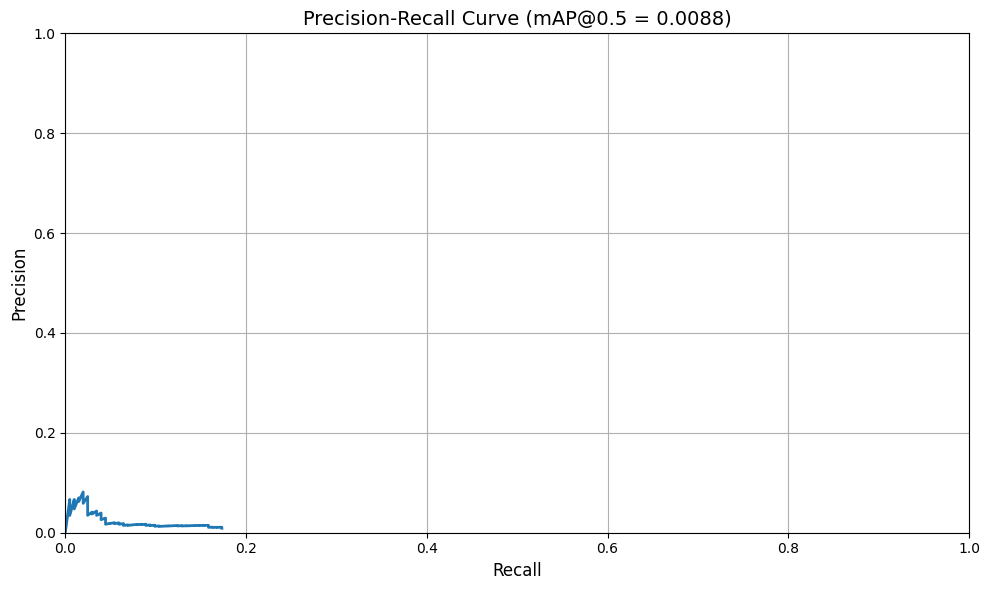

In [85]:
def evaluate_model_map(model, valid_dataset, anchors, device, img_size=416, conf_threshold=0.5, iou_threshold=0.5):
    """
    Оценивает модель на валидационном наборе и вычисляет mAP

    """
    model.eval()
    all_pred_boxes = []
    all_gt_boxes = []
    
    with torch.no_grad():
        for idx in tqdm(range(len(valid_dataset)), desc="Evaluating"):
            img_tensor, target = valid_dataset[idx]
            img_tensor = img_tensor.unsqueeze(0).to(device)
            
            output = model(img_tensor)
            
            img_file = valid_dataset.image_files[idx]
            label_file = img_file.replace('.jpg', '.txt').replace('.png', '.txt')
            label_path = os.path.join(valid_dataset.labels_dir, label_file)
            
            img_path = os.path.join(valid_dataset.images_dir, img_file)
            img = Image.open(img_path)
            original_size = img.size
            
            pred_boxes = decode_yolo_output(output.cpu(), anchors, img_size=img_size, 
                                           conf_threshold=conf_threshold)
            nms_boxes = non_max_suppression(pred_boxes, iou_threshold=0.5, conf_threshold=conf_threshold)
            
            scale_x = original_size[0] / img_size
            scale_y = original_size[1] / img_size
            scaled_pred_boxes = []
            for x_min, y_min, x_max, y_max, conf in nms_boxes:
                x_min_scaled = x_min * scale_x
                y_min_scaled = y_min * scale_y
                x_max_scaled = x_max * scale_x
                y_max_scaled = y_max * scale_y
                scaled_pred_boxes.append((x_min_scaled, y_min_scaled, x_max_scaled, y_max_scaled, conf))
            
            all_pred_boxes.append(scaled_pred_boxes)
            
            gt_boxes = []
            if os.path.exists(label_path):
                boxes = parse_yolo_annotation(label_path, original_size[0], original_size[1])
                for box in boxes:
                    gt_boxes.append((box['x_min'], box['y_min'], box['x_max'], box['y_max']))
            
            all_gt_boxes.append(gt_boxes)
    
    mAP, precision, recall = calculate_map(all_pred_boxes, all_gt_boxes, 
                                          iou_threshold=iou_threshold, 
                                          conf_threshold=conf_threshold)
    
    return mAP, precision, recall, all_pred_boxes, all_gt_boxes


mAP, precision, recall, all_pred, all_gt = evaluate_model_map(
    model, valid_dataset, anchors, device, img_size=416, conf_threshold=0.5, iou_threshold=0.5
)

print(f"mAP@0.5: {mAP:.4f}")
print(f"Общее количество предсказаний: {sum(len(p) for p in all_pred)}")
print(f"Общее количество ground truth: {sum(len(g) for g in all_gt)}")

plt.figure(figsize=(10, 6))
plt.plot(recall, precision, linewidth=2)
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title(f'Precision-Recall Curve (mAP@0.5 = {mAP:.4f})', fontsize=14)
plt.grid(True)
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.tight_layout()
plt.show()


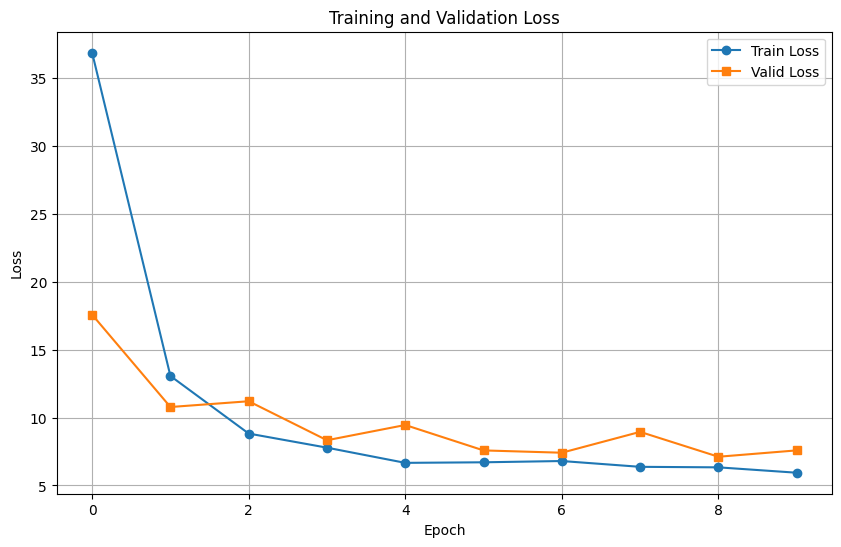

Evaluating: 100%|██████████| 26/26 [00:12<00:00,  2.03it/s]


mAP@0.5: 0.0088
Общее количество предсказаний: 3885
Общее количество ground truth: 202


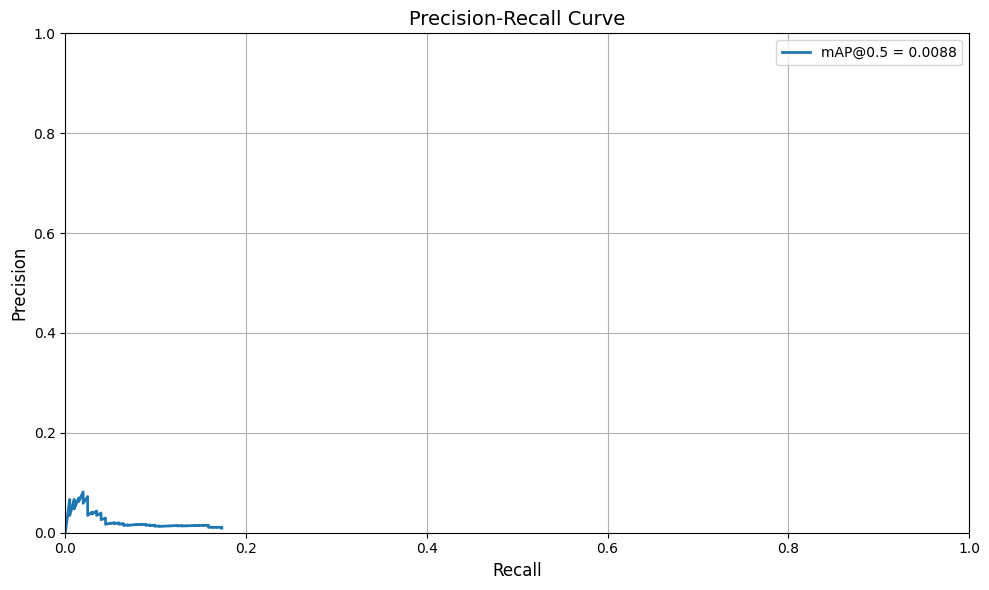

In [87]:
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(valid_losses, label='Valid Loss', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

mAP, precision, recall, all_pred, all_gt = evaluate_model_map(
    model, valid_dataset, anchors, device, img_size=416, conf_threshold=0.5, iou_threshold=0.5
)

print(f"mAP0.5: {mAP:.4f}")
print(f"Общее количество предсказаний: {sum(len(p) for p in all_pred)}")
print(f"Общее количество ground truth: {sum(len(g) for g in all_gt)}")

plt.figure(figsize=(10, 6))
plt.plot(recall, precision, linewidth=2, label=f'mAP@0.5 = {mAP:.4f}')
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve', fontsize=14)
plt.legend()
plt.grid(True)
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.tight_layout()
plt.show()


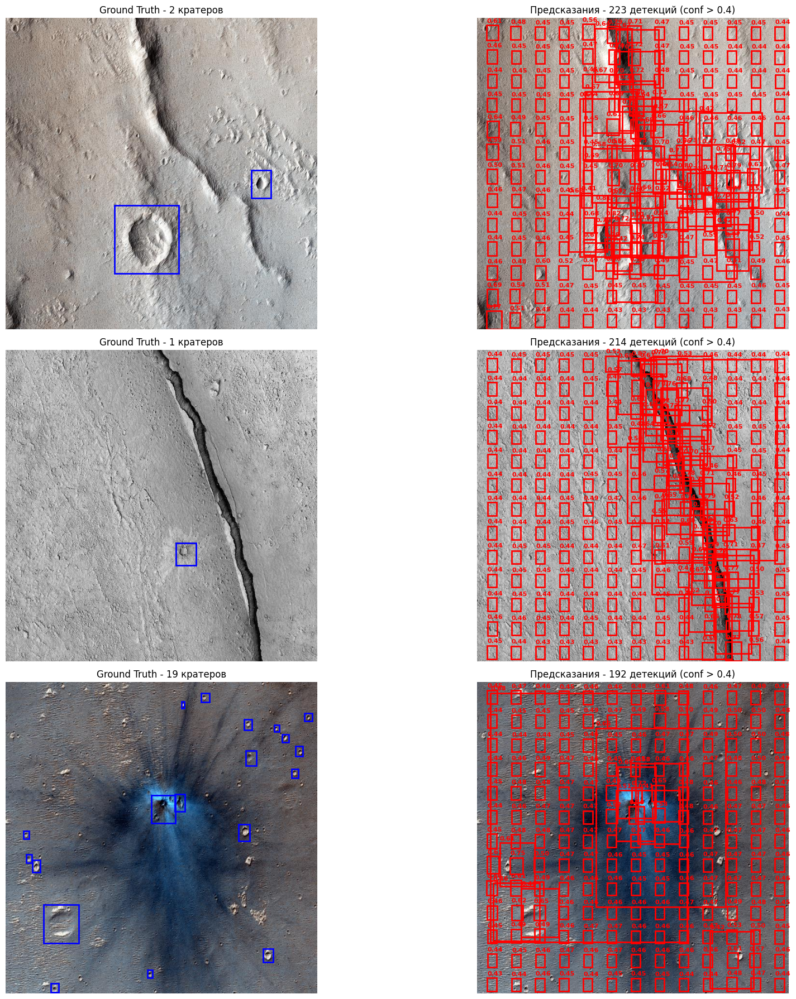

In [88]:
model.eval()

test_images = os.listdir(VALID_IMAGES)[:3]

fig, axes = plt.subplots(len(test_images), 2, figsize=(20, 6 * len(test_images)))

if len(test_images) == 1:
    axes = axes.reshape(1, -1)

for idx, test_img_name in enumerate(test_images):
    test_img_path = os.path.join(VALID_IMAGES, test_img_name)
    test_label_path = test_img_path.replace('images', 'labels').replace('.jpg', '.txt')
    
    test_img = Image.open(test_img_path).convert('RGB')
    original_size = test_img.size
    
    transform = transforms.Compose([
        transforms.Resize((416, 416)),
        transforms.ToTensor(),
    ])
    img_tensor = transform(test_img).unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = model(img_tensor)
    
    predicted_boxes = decode_yolo_output(output.cpu(), anchors, img_size=416, conf_threshold=0.3)
    nms_boxes = non_max_suppression(predicted_boxes, iou_threshold=0.4, conf_threshold=0.4)
    
    gt_boxes = []
    if os.path.exists(test_label_path):
        gt_boxes = parse_yolo_annotation(test_label_path, original_size[0], original_size[1])
    
    axes[idx, 0].imshow(test_img)
    axes[idx, 0].set_title(f"Ground Truth - {len(gt_boxes)} кратеров", fontsize=12)
    axes[idx, 0].axis('off')
    for box in gt_boxes:
        rect = Rectangle((box['x_min'], box['y_min']), box['width'], box['height'],
                        linewidth=2, edgecolor='blue', facecolor='none')
        axes[idx, 0].add_patch(rect)
    
    scale_x = original_size[0] / 416
    scale_y = original_size[1] / 416
    axes[idx, 1].imshow(test_img)
    axes[idx, 1].set_title(f"Предсказания - {len(nms_boxes)} детекций (conf > 0.4)", fontsize=12)
    axes[idx, 1].axis('off')
    
    valid_boxes = []
    for x_min, y_min, x_max, y_max, conf in nms_boxes:
        x_min_scaled = x_min * scale_x
        y_min_scaled = y_min * scale_y
        width_scaled = (x_max - x_min) * scale_x
        height_scaled = (y_max - y_min) * scale_y
        
        if width_scaled > 0 and height_scaled > 0 and \
           x_min_scaled >= 0 and y_min_scaled >= 0 and \
           x_min_scaled + width_scaled <= original_size[0] and \
           y_min_scaled + height_scaled <= original_size[1]:
            valid_boxes.append((x_min_scaled, y_min_scaled, width_scaled, height_scaled, conf))
            rect = Rectangle((x_min_scaled, y_min_scaled), width_scaled, height_scaled,
                            linewidth=2, edgecolor='red', facecolor='none')
            axes[idx, 1].add_patch(rect)
            axes[idx, 1].text(x_min_scaled, y_min_scaled - 5, f"{conf:.2f}", 
                            color='red', fontsize=8, weight='bold')
    

plt.tight_layout()
plt.show()


## МОДЕЛЬ с предобученным Backbone



In [89]:
import torchvision.models as models
from torchvision.models import ResNet18_Weights

class CraterDetectorResNet(nn.Module):
    """
    Кастомная модель детекции с предобученным ResNet18 backbone
    """
    
    def __init__(self, pretrained=True):
        super(CraterDetectorResNet, self).__init__()
        
        # Загружаем предобученный ResNet18
        if pretrained:
            weights = ResNet18_Weights.IMAGENET1K_V1
            resnet = models.resnet18(weights=weights)
        else:
            resnet = models.resnet18(weights=None)
        
        # Извлекаем слои backbone (до avgpool)
        self.conv1 = resnet.conv1        # 3 -> 64, stride=2
        self.bn1 = resnet.bn1
        self.relu = resnet.relu
        self.maxpool = resnet.maxpool    # stride=2
        
        self.layer1 = resnet.layer1      # 64 -> 64
        self.layer2 = resnet.layer2      # 64 -> 128, stride=2
        self.layer3 = resnet.layer3      # 128 -> 256, stride=2
        self.layer4 = resnet.layer4      # 256 -> 512, stride=2
        
        # После всех слоев: 416 -> 208 -> 104 -> 52 -> 26 -> 13
        
        # Подготовщик фичей
        self.refine = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        
        # Голова
        self.detect = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.Conv2d(64, 5, kernel_size=1),  # x, y, w, h, conf
        )
        
        for m in self.refine.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        
        for m in self.detect.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        x = self.conv1(x)      # -> (B, 64, 208, 208)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)    # -> (B, 64, 104, 104)
        
        x = self.layer1(x)     # -> (B, 64, 104, 104)
        x = self.layer2(x)     # -> (B, 128, 52, 52)
        x = self.layer3(x)     # -> (B, 256, 26, 26)
        x = self.layer4(x)     # -> (B, 512, 13, 13)
        
        x = self.refine(x)     # -> (B, 128, 13, 13)
        
        x = self.detect(x)     # -> (B, 5, 13, 13)
        
        return x


resnet_model = CraterDetectorResNet(pretrained=True)
print(f"Параметров: {sum(p.numel() for p in resnet_model.parameters()):,}")
print(f"Обучаемых параметров: {sum(p.numel() for p in resnet_model.parameters() if p.requires_grad):,}")

dummy_input = torch.randn(2, 3, 416, 416)
with torch.no_grad():
    dummy_output = resnet_model(dummy_input)
    
print(f"\nВход: {dummy_input.shape}")
print(f"Выход: {dummy_output.shape}")



Параметров: 12,726,469
Обучаемых параметров: 12,726,469

Вход: torch.Size([2, 3, 416, 416])
Выход: torch.Size([2, 5, 13, 13])


In [91]:
class ImprovedCraterDataset(Dataset):
    """
    Улучшенный датасет с правильной нормализацией ImageNet и аугментациями
    """
    
    def __init__(self, images_dir, labels_dir, img_size=416, grid_size=13, augment=False):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.img_size = img_size
        self.grid_size = grid_size
        self.augment = augment
        self.image_files = [f for f in os.listdir(images_dir) 
                           if f.endswith(('.jpg', '.png'))]
        
        self.normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
        
        if self.augment:
            self.augment_transform = transforms.Compose([
                transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.1),
                transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.3),
            ])
        
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_file = self.image_files[idx]
        img_path = os.path.join(self.images_dir, img_file)
        img = Image.open(img_path).convert('RGB')
        original_size = img.size
        
        label_file = img_file.replace('.jpg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(self.labels_dir, label_file)
        
        boxes = []
        if os.path.exists(label_path):
            boxes = parse_yolo_annotation(label_path, original_size[0], original_size[1])
        
        if self.augment and random.random() > 0.5:
            img = self.augment_transform(img)
        
        img = img.resize((self.img_size, self.img_size), Image.BILINEAR)
        
        img_tensor = transforms.ToTensor()(img)
        img_tensor = self.normalize(img_tensor)
        
        target = torch.zeros(5, self.grid_size, self.grid_size)
        
        scale_x = self.img_size / original_size[0]
        scale_y = self.img_size / original_size[1]
        
        for box in boxes:
            x_center = box['x_center'] * scale_x
            y_center = box['y_center'] * scale_y
            width = box['width'] * scale_x
            height = box['height'] * scale_y
            
            # Нормализация к [0, 1]
            x_norm = x_center / self.img_size
            y_norm = y_center / self.img_size
            w_norm = width / self.img_size
            h_norm = height / self.img_size
            
            # Определяем ячейку
            grid_x = int(x_norm * self.grid_size)
            grid_y = int(y_norm * self.grid_size)
            grid_x = max(0, min(self.grid_size - 1, grid_x))
            grid_y = max(0, min(self.grid_size - 1, grid_y))
            
            # Координаты относительно ячейки
            cell_x = (x_norm * self.grid_size) - grid_x
            cell_y = (y_norm * self.grid_size) - grid_y
            
            # Записываем в target
            if target[4, grid_y, grid_x] == 0:
                target[0, grid_y, grid_x] = cell_x
                target[1, grid_y, grid_x] = cell_y
                target[2, grid_y, grid_x] = w_norm
                target[3, grid_y, grid_x] = h_norm
                target[4, grid_y, grid_x] = 1.0
        
        return img_tensor, target


train_dataset_improved = ImprovedCraterDataset(
    TRAIN_IMAGES, TRAIN_LABELS, 
    img_size=416, grid_size=13, augment=True
)
valid_dataset_improved = ImprovedCraterDataset(
    VALID_IMAGES, VALID_LABELS, 
    img_size=416, grid_size=13, augment=False
)

sample_img, sample_target = train_dataset_improved[0]
print(f"  Image: {sample_img.shape}")
print(f"  Target: {sample_target.shape}")


  Image: torch.Size([3, 416, 416])
  Target: torch.Size([5, 13, 13])


In [93]:
def compute_iou_loss(pred_boxes, target_boxes, eps=1e-6):
    """
    Вычисляет IoU loss для лучшей локализации
    
    Args:
        pred_boxes: (N, 4) - [x, y, w, h] нормализованные
        target_boxes: (N, 4) - [x, y, w, h] нормализованные
    
    Returns:
        iou_loss: скаляр
    """
    pred_x1 = pred_boxes[:, 0] - pred_boxes[:, 2] / 2
    pred_y1 = pred_boxes[:, 1] - pred_boxes[:, 3] / 2
    pred_x2 = pred_boxes[:, 0] + pred_boxes[:, 2] / 2
    pred_y2 = pred_boxes[:, 1] + pred_boxes[:, 3] / 2
    
    target_x1 = target_boxes[:, 0] - target_boxes[:, 2] / 2
    target_y1 = target_boxes[:, 1] - target_boxes[:, 3] / 2
    target_x2 = target_boxes[:, 0] + target_boxes[:, 2] / 2
    target_y2 = target_boxes[:, 1] + target_boxes[:, 3] / 2
    
    # Площадь пересечения
    inter_x1 = torch.max(pred_x1, target_x1)
    inter_y1 = torch.max(pred_y1, target_y1)
    inter_x2 = torch.min(pred_x2, target_x2)
    inter_y2 = torch.min(pred_y2, target_y2)
    
    inter_w = (inter_x2 - inter_x1).clamp(min=0)
    inter_h = (inter_y2 - inter_y1).clamp(min=0)
    inter_area = inter_w * inter_h
    
    # Площадь объединения
    pred_area = pred_boxes[:, 2] * pred_boxes[:, 3]
    target_area = target_boxes[:, 2] * target_boxes[:, 3]
    union_area = pred_area + target_area - inter_area
    
    # IoU
    iou = inter_area / (union_area + eps)
    
    # IoU loss = 1 - IoU
    iou_loss = 1 - iou
    
    return iou_loss.mean()


def focal_loss(pred, target, alpha=0.25, gamma=2.0):
    """
    Focal Loss для objectness - борется с дисбалансом классов
    
    Args:
        pred: (N,) - предсказания после sigmoid [0, 1]
        target: (N,) - целевые значения {0, 1}
        alpha: вес для положительных примеров
        gamma: фокусирующий параметр
    
    Returns:
        loss: скаляр
    """
    bce = F.binary_cross_entropy(pred, target, reduction='none')
    
    # Focal weight
    p_t = pred * target + (1 - pred) * (1 - target)
    focal_weight = (1 - p_t) ** gamma
    
    # Alpha weight
    alpha_t = alpha * target + (1 - alpha) * (1 - target)
    
    loss = alpha_t * focal_weight * bce
    
    return loss.mean()


def improved_detection_loss(pred, target, lambda_coord=5.0, lambda_iou=2.0, lambda_noobj=0.5):
    """
    Улучшенная функция потерь с IoU loss и Focal loss

    """
    obj_mask = target[:, 4, :, :] > 0
    noobj_mask = target[:, 4, :, :] == 0
    
    # Применяем активации
    pred_xy = torch.sigmoid(pred[:, 0:2, :, :])
    pred_wh = torch.sigmoid(pred[:, 2:4, :, :])  # sigmoid вместо exp для стабильности
    pred_conf = torch.sigmoid(pred[:, 4:5, :, :])
    
    coord_loss = torch.tensor(0.0).to(pred.device)
    if obj_mask.sum() > 0:
        # XY loss
        xy_loss = F.mse_loss(
            pred_xy.permute(0, 2, 3, 1)[obj_mask],
            target[:, 0:2, :, :].permute(0, 2, 3, 1)[obj_mask],
            reduction='mean'
        )
        
        # WH loss
        wh_loss = F.mse_loss(
            pred_wh.permute(0, 2, 3, 1)[obj_mask],
            target[:, 2:4, :, :].permute(0, 2, 3, 1)[obj_mask],
            reduction='mean'
        )
        
        coord_loss = lambda_coord * (xy_loss + wh_loss)
    
    iou_loss_val = torch.tensor(0.0).to(pred.device)
    if obj_mask.sum() > 0:
        # Собираем боксы с объектами
        pred_boxes_obj = torch.cat([
            pred_xy.permute(0, 2, 3, 1)[obj_mask],
            pred_wh.permute(0, 2, 3, 1)[obj_mask]
        ], dim=1)
        
        target_boxes_obj = torch.cat([
            target[:, 0:2, :, :].permute(0, 2, 3, 1)[obj_mask],
            target[:, 2:4, :, :].permute(0, 2, 3, 1)[obj_mask]
        ], dim=1)
        
        iou_loss_val = lambda_iou * compute_iou_loss(pred_boxes_obj, target_boxes_obj)
    
    obj_loss = torch.tensor(0.0).to(pred.device)
    if obj_mask.sum() > 0:
        obj_loss = focal_loss(
            pred_conf[:, 0, :, :][obj_mask],
            target[:, 4, :, :][obj_mask],
            alpha=0.75,
            gamma=2.0
        )
    
    noobj_loss = torch.tensor(0.0).to(pred.device)
    if noobj_mask.sum() > 0:
        noobj_loss = lambda_noobj * F.binary_cross_entropy(
            pred_conf[:, 0, :, :][noobj_mask],
            target[:, 4, :, :][noobj_mask],
            reduction='mean'
        )
    
    total_loss = coord_loss + iou_loss_val + obj_loss + noobj_loss
    
    return total_loss, coord_loss, iou_loss_val, obj_loss, noobj_loss

dummy_pred = torch.randn(2, 5, 13, 13)
dummy_target = torch.zeros(2, 5, 13, 13)
dummy_target[0, :, 5, 5] = torch.tensor([0.5, 0.5, 0.2, 0.2, 1.0])
dummy_target[1, :, 8, 3] = torch.tensor([0.3, 0.7, 0.15, 0.15, 1.0])

loss, coord, iou_l, obj, noobj = improved_detection_loss(dummy_pred, dummy_target)
print(f" Total: {loss.item():.4f}")
print(f"  Coord: {coord.item():.4f}")
print(f"  IoU: {iou_l.item():.4f}")
print(f"  Obj: {obj.item():.4f}")
print(f"  NoObj: {noobj.item():.4f}")


 Total: 3.8889
  Coord: 1.1898
  IoU: 1.9650
  Obj: 0.3331
  NoObj: 0.4010


In [94]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}\n")

batch_size = 8
train_loader_resnet = DataLoader(
    train_dataset_improved, 
    batch_size=batch_size, 
    shuffle=True, 
    num_workers=0,
    pin_memory=True if torch.cuda.is_available() else False
)
valid_loader_resnet = DataLoader(
    valid_dataset_improved, 
    batch_size=batch_size, 
    shuffle=False, 
    num_workers=0,
    pin_memory=True if torch.cuda.is_available() else False
)

resnet_model = CraterDetectorResNet(pretrained=True).to(device)

backbone_params = []
for name, param in resnet_model.named_parameters():
    if 'conv1' in name or 'bn1' in name or 'layer' in name:
        backbone_params.append(param)

# Head (новые слои) - больший LR
head_params = []
for name, param in resnet_model.named_parameters():
    if 'refine' in name or 'detect' in name:
        head_params.append(param)

optimizer = torch.optim.AdamW([
    {'params': backbone_params, 'lr': 1e-4},   # Маленький LR для backbone
    {'params': head_params, 'lr': 1e-3}        # Больший LR для head
], weight_decay=1e-4)

scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=10, T_mult=2, eta_min=1e-6
)

num_epochs = 20



Device: cpu



In [96]:
history_resnet = {
    'train_loss': [],
    'valid_loss': [],
    'lr': []
}

best_valid_loss = float('inf')

for epoch in range(num_epochs):
    resnet_model.train()
    epoch_losses = {'total': 0, 'coord': 0, 'iou': 0, 'obj': 0, 'noobj': 0}
    
    pbar = tqdm(train_loader_resnet, desc=f"Эпоха {epoch+1}/{num_epochs}")
    for batch_idx, (images, targets) in enumerate(pbar):
        images = images.to(device)
        targets = targets.to(device)
        
        outputs = resnet_model(images)
        loss, coord_l, iou_l, obj_l, noobj_l = improved_detection_loss(outputs, targets)
        
        optimizer.zero_grad()
        loss.backward()
        
        # Gradient clipping для стабильности
        torch.nn.utils.clip_grad_norm_(resnet_model.parameters(), max_norm=10.0)
        
        optimizer.step()
        
        epoch_losses['total'] += loss.item()
        epoch_losses['coord'] += coord_l.item()
        
        pbar.set_postfix({
            'loss': f"{loss.item():.3f}",
        })
    
    avg_train_loss = epoch_losses['total'] / len(train_loader_resnet)
    
    history_resnet['train_loss'].append(avg_train_loss)
    history_resnet['lr'].append(optimizer.param_groups[0]['lr'])
    
    resnet_model.eval()
    valid_loss = 0
    valid_coord = 0
    valid_iou = 0
    
    with torch.no_grad():
        for images, targets in valid_loader_resnet:
            images = images.to(device)
            targets = targets.to(device)
            outputs = resnet_model(images)
            loss, coord_l, iou_l, _, _ = improved_detection_loss(outputs, targets)
            valid_loss += loss.item()
    
    avg_valid_loss = valid_loss / len(valid_loader_resnet)
    
    history_resnet['valid_loss'].append(avg_valid_loss)
    
    scheduler.step()
    
    # Выводим результаты
    print(f"Эпоха {epoch+1}/{num_epochs}:")
    print(f"  Train Loss: {avg_train_loss:.4f}")
    print(f"  Valid Loss: {avg_valid_loss:.4f}")
    print(f"  LR: {optimizer.param_groups[0]['lr']:.6f} (backbone) / {optimizer.param_groups[1]['lr']:.6f} (head)")
    
    if avg_valid_loss < best_valid_loss:
        best_valid_loss = avg_valid_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': resnet_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'valid_loss': avg_valid_loss,
        }, 'best_resnet_crater_detector.pth')
    else:
        print()


Эпоха 1/20: 100%|██████████| 13/13 [00:34<00:00,  2.62s/it, loss=3.314]


Эпоха 1/20:
  Train Loss: 3.3950
  Valid Loss: 3.1966
  LR: 0.000098 (backbone) / 0.000976 (head)


Эпоха 2/20: 100%|██████████| 13/13 [00:37<00:00,  2.86s/it, loss=2.870]


Эпоха 2/20:
  Train Loss: 2.9881
  Valid Loss: 3.0233
  LR: 0.000091 (backbone) / 0.000905 (head)


Эпоха 3/20: 100%|██████████| 13/13 [00:35<00:00,  2.72s/it, loss=2.813]


Эпоха 3/20:
  Train Loss: 2.8287
  Valid Loss: 3.0041
  LR: 0.000080 (backbone) / 0.000794 (head)


Эпоха 4/20: 100%|██████████| 13/13 [00:35<00:00,  2.72s/it, loss=2.839]


Эпоха 4/20:
  Train Loss: 2.7236
  Valid Loss: 3.0145
  LR: 0.000066 (backbone) / 0.000655 (head)



Эпоха 5/20: 100%|██████████| 13/13 [00:36<00:00,  2.82s/it, loss=2.970]


Эпоха 5/20:
  Train Loss: 2.6933
  Valid Loss: 2.8884
  LR: 0.000051 (backbone) / 0.000501 (head)


Эпоха 6/20: 100%|██████████| 13/13 [00:31<00:00,  2.43s/it, loss=2.598]


Эпоха 6/20:
  Train Loss: 2.5768
  Valid Loss: 2.9176
  LR: 0.000035 (backbone) / 0.000346 (head)



Эпоха 7/20: 100%|██████████| 13/13 [00:31<00:00,  2.45s/it, loss=2.525]


Эпоха 7/20:
  Train Loss: 2.5052
  Valid Loss: 2.8583
  LR: 0.000021 (backbone) / 0.000207 (head)


Эпоха 8/20: 100%|██████████| 13/13 [00:32<00:00,  2.50s/it, loss=2.484]


Эпоха 8/20:
  Train Loss: 2.4645
  Valid Loss: 2.8448
  LR: 0.000010 (backbone) / 0.000096 (head)


Эпоха 9/20: 100%|██████████| 13/13 [00:33<00:00,  2.61s/it, loss=2.626]


Эпоха 9/20:
  Train Loss: 2.4538
  Valid Loss: 2.8436
  LR: 0.000003 (backbone) / 0.000025 (head)


Эпоха 10/20: 100%|██████████| 13/13 [00:32<00:00,  2.50s/it, loss=2.467]


Эпоха 10/20:
  Train Loss: 2.4216
  Valid Loss: 2.8351
  LR: 0.000100 (backbone) / 0.001000 (head)


Эпоха 11/20: 100%|██████████| 13/13 [00:30<00:00,  2.31s/it, loss=2.484]


Эпоха 11/20:
  Train Loss: 2.4164
  Valid Loss: 2.8656
  LR: 0.000099 (backbone) / 0.000994 (head)



Эпоха 12/20: 100%|██████████| 13/13 [00:31<00:00,  2.41s/it, loss=2.653]


Эпоха 12/20:
  Train Loss: 2.4680
  Valid Loss: 2.9325
  LR: 0.000098 (backbone) / 0.000976 (head)



Эпоха 13/20: 100%|██████████| 13/13 [00:32<00:00,  2.51s/it, loss=2.664]


Эпоха 13/20:
  Train Loss: 2.4122
  Valid Loss: 2.9034
  LR: 0.000095 (backbone) / 0.000946 (head)



Эпоха 14/20: 100%|██████████| 13/13 [00:29<00:00,  2.24s/it, loss=2.263]


Эпоха 14/20:
  Train Loss: 2.3352
  Valid Loss: 2.8788
  LR: 0.000091 (backbone) / 0.000905 (head)



Эпоха 15/20: 100%|██████████| 13/13 [00:29<00:00,  2.27s/it, loss=1.853]


Эпоха 15/20:
  Train Loss: 2.2712
  Valid Loss: 2.7666
  LR: 0.000086 (backbone) / 0.000854 (head)


Эпоха 16/20: 100%|██████████| 13/13 [00:33<00:00,  2.54s/it, loss=2.120]


Эпоха 16/20:
  Train Loss: 2.3003
  Valid Loss: 2.8293
  LR: 0.000080 (backbone) / 0.000794 (head)



Эпоха 17/20: 100%|██████████| 13/13 [00:34<00:00,  2.62s/it, loss=2.345]


Эпоха 17/20:
  Train Loss: 2.2585
  Valid Loss: 2.8434
  LR: 0.000073 (backbone) / 0.000727 (head)



Эпоха 18/20: 100%|██████████| 13/13 [00:30<00:00,  2.35s/it, loss=2.275]


Эпоха 18/20:
  Train Loss: 2.2469
  Valid Loss: 2.8594
  LR: 0.000066 (backbone) / 0.000655 (head)



Эпоха 19/20: 100%|██████████| 13/13 [00:32<00:00,  2.49s/it, loss=2.084]


Эпоха 19/20:
  Train Loss: 2.2071
  Valid Loss: 2.8576
  LR: 0.000058 (backbone) / 0.000579 (head)



Эпоха 20/20: 100%|██████████| 13/13 [00:32<00:00,  2.52s/it, loss=2.343]


Эпоха 20/20:
  Train Loss: 2.2010
  Valid Loss: 2.8736
  LR: 0.000051 (backbone) / 0.000501 (head)



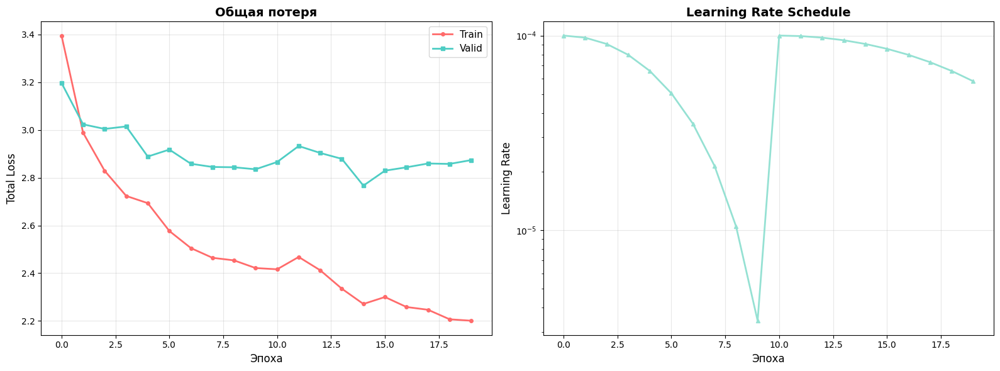

In [97]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6)) 

axes[0].plot(history_resnet['train_loss'], label='Train', marker='o', linewidth=2, markersize=4, color='#FF6B6B')
axes[0].plot(history_resnet['valid_loss'], label='Valid', marker='s', linewidth=2, markersize=4, color='#4ECDC4')
axes[0].set_xlabel('Эпоха', fontsize=12)
axes[0].set_ylabel('Total Loss', fontsize=12)
axes[0].set_title('Общая потеря', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

axes[1].plot(history_resnet['lr'], marker='^', linewidth=2, color='#95E1D3', markersize=4)
axes[1].set_xlabel('Эпоха', fontsize=12)
axes[1].set_ylabel('Learning Rate', fontsize=12)
axes[1].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
axes[1].set_yscale('log')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [98]:
def decode_resnet_predictions(output, img_size=416, grid_size=13, conf_threshold=0.5):
    """
    Декодирует выход ResNet модели (с sigmoid активациями для wh)
    """
    batch_size = output.shape[0]
    boxes = []
    
    pred_xy = torch.sigmoid(output[:, 0:2, :, :])
    pred_wh = torch.sigmoid(output[:, 2:4, :, :])  # sigmoid!
    pred_conf = torch.sigmoid(output[:, 4:5, :, :])
    
    cell_size = img_size / grid_size
    
    for b in range(batch_size):
        for i in range(grid_size):
            for j in range(grid_size):
                conf = pred_conf[b, 0, i, j].item()
                
                if conf > conf_threshold:
                    # Координаты относительно ячейки
                    x_cell = pred_xy[b, 0, i, j].item()
                    y_cell = pred_xy[b, 1, i, j].item()
                    
                    # Нормализованные размеры
                    w_norm = pred_wh[b, 0, i, j].item()
                    h_norm = pred_wh[b, 1, i, j].item()
                    
                    # Абсолютные координаты
                    x_center = (j + x_cell) * cell_size
                    y_center = (i + y_cell) * cell_size
                    width = w_norm * img_size
                    height = h_norm * img_size
                    
                    # Формат (x_min, y_min, x_max, y_max)
                    x_min = x_center - width / 2
                    y_min = y_center - height / 2
                    x_max = x_center + width / 2
                    y_max = y_center + height / 2
                    
                    boxes.append((x_min, y_min, x_max, y_max, conf))
    
    return boxes


/var/folders/42/839ljb3n1rjckdc_lg3lhl2h0000gn/T/ipykernel_1788/2725905657.py:90: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/42/839ljb3n1rjckdc_lg3lhl2h0000gn/T/ipykernel_1788/2725905657.py:90: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/nikitakamenev/.pyenv/versions/3.11.10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nikitakamenev/.pyenv/versions/3.11.10/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


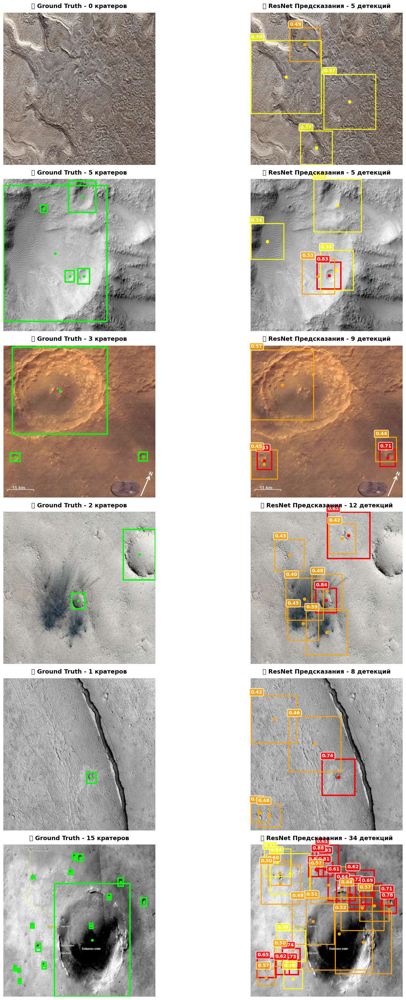

In [99]:
resnet_model.eval()

num_samples = 6
sample_indices = random.sample(range(len(valid_dataset_improved)), num_samples)

fig, axes = plt.subplots(num_samples, 2, figsize=(18, 5*num_samples))

for idx, sample_idx in enumerate(sample_indices):
    img_file = valid_dataset_improved.image_files[sample_idx]
    img_path = os.path.join(VALID_IMAGES, img_file)
    label_path = os.path.join(VALID_LABELS, img_file.replace('.jpg', '.txt').replace('.png', '.txt'))
    
    img = Image.open(img_path).convert('RGB')
    original_size = img.size
    
    img_tensor, _ = valid_dataset_improved[sample_idx]
    img_tensor = img_tensor.unsqueeze(0).to(device)
    
    with torch.no_grad():
        output = resnet_model(img_tensor)
    
    pred_boxes = decode_resnet_predictions(output.cpu(), conf_threshold=0.3)
    
    nms_boxes = non_max_suppression(pred_boxes, iou_threshold=0.4, conf_threshold=0.3)
    
    # Загружаем ground truth
    gt_boxes = []
    if os.path.exists(label_path):
        gt_boxes = parse_yolo_annotation(label_path, original_size[0], original_size[1])
    
    # Масштабируем предсказания
    scale_x = original_size[0] / 416
    scale_y = original_size[1] / 416
    
    # === Ground Truth ===
    axes[idx, 0].imshow(img)
    axes[idx, 0].set_title(f"🎯 Ground Truth - {len(gt_boxes)} кратеров", 
                          fontsize=13, fontweight='bold', pad=10)
    axes[idx, 0].axis('off')
    
    for box in gt_boxes:
        rect = Rectangle((box['x_min'], box['y_min']), box['width'], box['height'],
                        linewidth=3, edgecolor='lime', facecolor='none', linestyle='-')
        axes[idx, 0].add_patch(rect)
        # Добавляем точку в центре
        cx = box['x_min'] + box['width']/2
        cy = box['y_min'] + box['height']/2
        axes[idx, 0].plot(cx, cy, 'o', color='lime', markersize=5)
    
    # === Предсказания ===
    axes[idx, 1].imshow(img)
    axes[idx, 1].set_title(f"🔥 ResNet Предсказания - {len(nms_boxes)} детекций", 
                          fontsize=13, fontweight='bold', pad=10)
    axes[idx, 1].axis('off')
    
    # Сортируем по confidence
    nms_boxes_sorted = sorted(nms_boxes, key=lambda x: x[4], reverse=True)
    
    for x_min, y_min, x_max, y_max, conf in nms_boxes_sorted:
        x_min_s = max(0, x_min * scale_x)
        y_min_s = max(0, y_min * scale_y)
        w_s = (x_max - x_min) * scale_x
        h_s = (y_max - y_min) * scale_y
        
        # Проверяем валидность
        if w_s > 0 and h_s > 0 and x_min_s + w_s <= original_size[0] and y_min_s + h_s <= original_size[1]:
            # Цвет зависит от confidence
            if conf > 0.6:
                color = 'red'
                lw = 3
            elif conf > 0.4:
                color = 'orange'
                lw = 2
            else:
                color = 'yellow'
                lw = 2
            
            rect = Rectangle((x_min_s, y_min_s), w_s, h_s,
                            linewidth=lw, edgecolor=color, facecolor='none')
            axes[idx, 1].add_patch(rect)
            
            axes[idx, 1].text(x_min_s, y_min_s - 8, f"{conf:.2f}", 
                            color='white', fontsize=10, weight='bold',
                            bbox=dict(boxstyle='round,pad=0.3', facecolor=color, alpha=0.8, edgecolor='white', linewidth=1.5))
            
            cx = x_min_s + w_s/2
            cy = y_min_s + h_s/2
            axes[idx, 1].plot(cx, cy, 'o', color=color, markersize=6)

plt.tight_layout()
plt.show()
